# 高亚洲冰川测高数据集成分析
## ICESat、ICESat-2、CryoSat-2数据系统偏差校正与可视化

**功能说明：**
- 集成三个卫星测高数据（ICESat、ICESat-2、CryoSat-2）
- 进行系统偏差校正
- 使用STL分解提取趋势
- 可视化子区域时间序列变化
- 计算质量平衡率


## 1. 导入必要的库


In [1]:
# 数据处理
import pandas as pd
import numpy as np
from datetime import datetime as dt
import time
import os
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeat
import cartopy.io.img_tiles as cimgt
from cartopy.mpl.ticker import LongitudeFormatter,LatitudeFormatter

# 统计分析
from statsmodels.tsa.seasonal import STL
import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from statsmodels.robust.robust_linear_model import RLM
from hampel import hampel

# 可视化
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch
import matplotlib.patches as patches
import matplotlib.ticker as ticker
from matplotlib import cm
import matplotlib.colors as mcolors
import matplotlib as mpl

# 设置绘图参数
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['pdf.fonttype'] = 42 
plt.rcParams['ps.fonttype'] = 42 
plt.rcParams['axes.unicode_minus'] = False

print("✓ 库导入成功")


✓ 库导入成功


## 2. 定义工具函数


In [2]:
def toYearFraction(date):
    """
    将日期转换为年份的小数形式
    
    参数:
        date: datetime对象
    
    返回:
        float: 年份+年内分数（例如：2023.5表示2023年中）
    """
    def sinceEpoch(date):
        return time.mktime(date.timetuple())
    
    s = sinceEpoch
    year = date.year
    startOfThisYear = dt(year=year, month=1, day=1)
    startOfNextYear = dt(year=year+1, month=1, day=1)
    
    yearElapsed = s(date) - s(startOfThisYear)
    yearDuration = s(startOfNextYear) - s(startOfThisYear)
    fraction = yearElapsed/yearDuration
    
    return date.year + fraction


## 3. 数据加载
### 3.1 ICESat数据（2003-2009）


In [3]:
# ICESat数据路径
icesat_seasonal_path = r'E:\revised_NCC_data\ICESat_result\ICESat_seasonal_elevation_results.xlsx'

# 读取ICESat高程变化数据
icesat = pd.read_excel(
    icesat_seasonal_path,
    sheet_name='campaign_value',
    header=0,
    usecols='C:AQ'
)
# 读取标准差
icesat_uncert = pd.read_excel(
    icesat_seasonal_path,
    sheet_name='campaign_uncert',
    header=0,
    usecols='C:AQ'
)
# 读取样本数量
icesat_num = pd.read_excel(
    icesat_seasonal_path,
    sheet_name='campaign_count',
    header=0,
    usecols='C:AQ'
)

print(f"✓ ICESat季节数据加载完成: {icesat.shape}")
print(f"  时间范围: {icesat['date'].min()} 至 {icesat['date'].max()}")

icesat_year_path = r'E:\revised_NCC_data\ICESat_result\ICESat_yearly_elevation_results.xlsx'
icesat_year = pd.read_excel(
    icesat_year_path,
    sheet_name='year_value',
    header=0,
    usecols='A:AO'
)
icesat_uncert_year = pd.read_excel(
    icesat_year_path,
    sheet_name='year_uncert',
    header=0,
    usecols='A:AO'
)
icesat_num_year = pd.read_excel(
    icesat_year_path,
    sheet_name='year_count',
    header=0,
    usecols='A:AO'
)

✓ ICESat季节数据加载完成: (19, 41)
  时间范围: 2003-03-11 00:00:00 至 2009-10-06 00:00:00


### 3.2 ICESat-2数据（2018-2023）


In [4]:
# ICESat-2数据路径
icesat2_seasonal_path = r"E:\revised_NCC_data\ICESat2_result\ICESat2_seasonal_elevation_results.xlsx"

# 读取ICESat-2高程变化数据（季节平均，考虑高程带和PDD）
icesat2 = pd.read_excel(
    icesat2_seasonal_path,
    sheet_name='month_value',
    header=0,
    usecols='A:AO'
)

# 读取标准差
icesat2_uncert = pd.read_excel(
    icesat2_seasonal_path,
    sheet_name='month_uncert',
    header=0,
    usecols='A:AO'
)

# 读取样本数量
icesat2_num = pd.read_excel(
    icesat2_seasonal_path,
    sheet_name='month_count',
    header=0,
    usecols='A:AO'
)

print(f"✓ ICESat-2数据加载完成: {icesat2.shape}")
print(f"  时间范围: {icesat2['date'].min()} 至 {icesat2['date'].max()}")

# ICESat-2数据路径
icesat2_year_path = r"E:\revised_NCC_data\ICESat2_result\ICESat2_yearly_elevation_results.xlsx"
icesat2_year = pd.read_excel(
    icesat2_year_path,
    sheet_name='year_value',
    header=0,
    usecols='A:AO'
)
icesat2_uncert_year = pd.read_excel(
    icesat2_year_path,
    sheet_name='year_uncert',
    header=0,
    usecols='A:AO'
)
icesat2_num_year = pd.read_excel(
    icesat2_year_path,
    sheet_name='year_count',
    header=0,
    usecols='A:AO'
)

✓ ICESat-2数据加载完成: (82, 41)
  时间范围: 2018-11-16 00:00:00 至 2025-08-16 00:00:00


### 3.3 CryoSat-2数据（2010-2023）


In [5]:
# CryoSat-2数据路径
cryosat2_seasonal_path = r'E:\revised_NCC_data\CryoSat2_result\CryoSat2_seasonal_elevation_results.xlsx'

# 读取CryoSat-2高程变化数据（3个月平均，考虑高程带）
cryosat2 = pd.read_excel(
    cryosat2_seasonal_path,
    sheet_name='month_value',
    header=0,
    usecols='A:AO'
)

# 读取标准差
cryosat2_uncert = pd.read_excel(
    cryosat2_seasonal_path,
    sheet_name='month_uncert',
    header=0,
    usecols='A:AO'
)

# 读取样本数量
cryosat2_num = pd.read_excel(
    cryosat2_seasonal_path,
    sheet_name='month_count',
    header=0,
    usecols='A:AO'
)

print(f"✓ CryoSat-2数据加载完成: {cryosat2.shape}")
print(f"  时间范围: {cryosat2['date'].min()} 至 {cryosat2['date'].max()}")

cryosat2_year_path = r"E:\revised_NCC_data\CryoSat2_result\CryoSat2_yearly_elevation_results.xlsx"
cryosat2_year = pd.read_excel(
    cryosat2_year_path,
    sheet_name='year_value',
    header=0,
    usecols='A:AO'
)
cryosat2_uncert_year = pd.read_excel(
    cryosat2_year_path,
    sheet_name='year_uncert',
    header=0,
    usecols='A:AO'
)
cryosat2_num_year = pd.read_excel(
    cryosat2_year_path,
    sheet_name='year_count',
    header=0,
    usecols='A:AO'
)

✓ CryoSat-2数据加载完成: (181, 41)
  时间范围: 2010-08-16 00:00:00 至 2025-08-16 00:00:00


### 3.4 辅助数据加载（TWS、面积、校正因子等）


In [6]:
# GRACE陆地水储量异常数据
tws_trend = pd.read_excel(
    'E:/HMA/GRACE_RL06/TWS_HMA_SSA.xlsx',
    sheet_name='tws',
    header=499,
    nrows=255,
    usecols='D:AQ'
)#STL趋势
tws = pd.read_excel(
    'E:/HMA/GRACE_RL06/TWS_HMA_SSA.xlsx',
    sheet_name='tws',
    header=233,
    nrows=255,
    usecols='D:AQ'
)#原始值

# 冰川面积和统计数据
statistics_path = 'E:/HMA/测高结果20231109.xlsx'

# 冰川面积
area = pd.read_excel(
    statistics_path,
    sheet_name='static_new',
    header=0,
    nrows=3,
    usecols='B:AN'
)

# 系统偏差校正值
correction = pd.read_excel(
    statistics_path,
    sheet_name='static_new',
    header=49,
    nrows=3,
    usecols='B:AN'
)

# 覆盖度因子
factor = pd.read_excel(
    statistics_path,
    sheet_name='coverage',
    header=0,
    nrows=24,
    usecols='I:M',
    index_col=0
)

# 绘图校正参数
corr_plot = pd.read_excel(statistics_path, 
                        sheet_name='static_new', 
                        header=132, nrows=8, 
                        usecols='A:AN',
                        index_col=0)

print("✓ 辅助数据加载完成")


✓ 辅助数据加载完成


### 3.5 数据预处理


In [7]:
# 获取子区域列表
head = area.columns.to_list() #39

# 计算用于气泡图的圆圈大小
# mass_change_size = (np.abs(mass_change_rate)) ** 0.5 * 2
# circle_center_y = -np.max(mass_change_size) + mass_change_size

print(f"✓ 数据预处理完成")
print(f"  子区域数量: {len(head)}")
print(f"  子区域列表前5个: {head[:5]}")


✓ 数据预处理完成
  子区域数量: 39
  子区域列表前5个: ['HMA', 'Hissar Alay', 'Pamir', 'W Tien Shan', 'E Tien Shan']


## 4. 核心数据处理函数

这个函数负责处理单个子区域的三个测高数据集，包括：
- 质量控制和数据过滤
- STL分解提取趋势
- 系统偏差校正
- 计算变化率和质量平衡


In [8]:
# 计算特定时段趋势
def calculate_grid_trends(ele_grid, num_grid, suffix, start_time=None, end_time=None, return_hampel=True):
    """
    计算所有网格的ICESat-2高程变化趋势 (修改版)
    
    核心步骤：
    1. 应用数量阈值过滤（<20个观测值设为NaN）
    2. 使用Hampel滤波器去除时间序列中的异常值
    3. 鲁棒线性回归（RLM）计算趋势、p-value和95%置信区间
    
    Returns:
    --------
    pd.DataFrame
        包含每个网格趋势的DataFrame
        - 'Slope': 斜率/趋势 (m/yr)
        - 'Pvalue': p-value (显著性)
        - 'CI/2': 95%置信区间半宽度 (m/yr)
        - 'Intercept': 截距 (m)
    """
    head_grid = ele_grid.columns.tolist()[2:] # 1,2,...,496
    # 1. 应用数量阈值
    for i in head_grid:
        mask = (num_grid[i] < 20) | (ele_grid[i] == 0) | (pd.isna(num_grid[i]))
        ele_grid.loc[mask, i] = np.nan
    
    # 初始化 results DataFrame
    results = pd.DataFrame(
        index=head_grid, 
        columns=['Slope', 'Pvalue', 'CI/2', 'Intercept'],
        dtype=float  # 预先指定数据类型
    )
    
    ele_grid_copy = ele_grid.copy()
    hampel_results = ele_grid.copy()
    hampel_results[head_grid] = np.nan
    if start_time is not None:
        ele_grid_copy = ele_grid_copy[(ele_grid_copy['date']>=start_time) & (ele_grid_copy['date']<end_time)]
    
    ele_grid_copy.sort_values(by='mid_day', inplace=True)
        
    for i in head_grid:
        valid_data = ele_grid_copy[[i, 'mid_day']].dropna()
        
        if len(valid_data) < 10:
            continue
        
        grid = valid_data.reset_index(drop=True)#连续索引
        year = grid['mid_day']
        dh = grid[i]
        
        # 2. Hampel滤波器去除异常值
        hamp_series = hampel(dh, window_size=5, n=3, imputation=True)
        hamp_series = hamp_series.astype(float)
        
        # 3. 鲁棒线性回归 (RLM)
        X = sm.add_constant(year)
        y = hamp_series
        
        rlm_model = RLM(y, X, M=sm.robust.norms.HuberT())
        rlm_results = rlm_model.fit()

        slope = rlm_results.params.iloc[1]
        intercept = rlm_results.params.iloc[0]
        pvalue = rlm_results.pvalues.iloc[1]
        
        # 计算95%置信区间
        conf_int = rlm_results.conf_int(alpha=0.05)
        # conf_int 是一个 DataFrame，[1] 是斜率的置信区间
        CI_half_width = (conf_int.iloc[1, 1] - conf_int.iloc[1, 0]) / 2

        results.loc[i, 'Slope'] = slope
        results.loc[i, 'Pvalue'] = pvalue
        results.loc[i, 'CI/2'] = CI_half_width
        results.loc[i, 'Intercept'] = intercept

    results.columns = [f'Slope_{suffix}', f'Pvalue_{suffix}', f'CI/2_{suffix}', f'Intercept_{suffix}']
    if not return_hampel:
        return results, None

    ele_grid2 = ele_grid.sort_values(by='mid_day', inplace=False)
    for i in head_grid:
        valid_data = ele_grid2[[i, 'mid_day']].dropna()
        if len(valid_data) < 10:
            continue

        grid = valid_data.reset_index(drop=True)#连续索引
        year = grid['mid_day']
        dh = grid[i]
        
        # 2. Hampel滤波器去除异常值
        hamp_series = hampel(dh, window_size=5, n=3, imputation=True)
        hamp_series = hamp_series.astype(float)
        hampel_results.loc[valid_data.index, i] = hamp_series.values
    
    
    return results, hampel_results

In [9]:
# ========== 时间转换为年份小数 ==========
cryosat2 = cryosat2.rename(columns={'days':'mid_day'})
cryosat2_num = cryosat2_num.rename(columns={'days':'mid_day'})
cryosat2_uncert = cryosat2_uncert.rename(columns={'days':'mid_day'})

icesat2 = icesat2.rename(columns={'days':'mid_day'})
icesat2_num = icesat2_num.rename(columns={'days':'mid_day'})
icesat2_uncert = icesat2_uncert.rename(columns={'days':'mid_day'})

for idx, row in cryosat2.iterrows():
    cryosat2.loc[idx, 'mid_day'] = toYearFraction(row['date'])
    cryosat2_num.loc[idx, 'mid_day'] = toYearFraction(row['date'])
    cryosat2_uncert.loc[idx, 'mid_day'] = toYearFraction(row['date'])
cryosat2['mid_day'] = cryosat2['mid_day'].astype(float)
cryosat2_num['mid_day'] = cryosat2_num['mid_day'].astype(float)
cryosat2_uncert['mid_day'] = cryosat2_uncert['mid_day'].astype(float)

for idx, row in icesat2.iterrows():
    icesat2.loc[idx, 'mid_day'] = toYearFraction(row['date'])
    icesat2_num.loc[idx, 'mid_day'] = toYearFraction(row['date'])
    icesat2_uncert.loc[idx, 'mid_day'] = toYearFraction(row['date'])
icesat2['mid_day'] = icesat2['mid_day'].astype(float)
icesat2_num['mid_day'] = icesat2_num['mid_day'].astype(float)
icesat2_uncert['mid_day'] = icesat2_uncert['mid_day'].astype(float)

for idx, row in icesat.iterrows():
    icesat.loc[idx, 'mid_day'] = toYearFraction(row['date'])
    icesat_num.loc[idx, 'mid_day'] = toYearFraction(row['date'])
    icesat_uncert.loc[idx, 'mid_day'] = toYearFraction(row['date'])
icesat['mid_day'] = icesat['mid_day'].astype(float)
icesat_num['mid_day'] = icesat_num['mid_day'].astype(float)
icesat_uncert['mid_day'] = icesat_uncert['mid_day'].astype(float)


C:\Users\Administrator\AppData\Local\Temp\ipykernel_47484\1992778917.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2010.6219178082192' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  cryosat2.loc[idx, 'mid_day'] = toYearFraction(row['date'])
C:\Users\Administrator\AppData\Local\Temp\ipykernel_47484\1992778917.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2010.6219178082192' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  cryosat2_num.loc[idx, 'mid_day'] = toYearFraction(row['date'])
C:\Users\Administrator\AppData\Local\Temp\ipykernel_47484\1992778917.py:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2010.6219178082192' has dtype incompatible wi

In [10]:
icesat_corrected = icesat.copy()
cryosat2_corrected = cryosat2.copy()
tws_corrected = tws.copy()
tws_trend_corrected = tws_trend.copy()

for region_name in head:
    # ========== 系统偏差校正 ==========
    corr = correction.loc[0, region_name]   # CryoSat-2校正值
    corr2 = correction.loc[1, region_name]  # TWS校正值
    corr3 = correction.loc[2, region_name]  # ICESat校正值

    icesat_corrected[region_name] = icesat_corrected[region_name] + corr3
    cryosat2_corrected[region_name] = cryosat2_corrected[region_name] + corr
    #tws_corrected[region_name] = tws_corrected[region_name] + corr2
    #tws_trend_corrected[region_name] = tws_trend_corrected[region_name] + corr2

# ========== 计算趋势 ==========
trend03to09, hampel_icesat_corrected = calculate_grid_trends(icesat_corrected, 
                                                                icesat_num, 'ice1', 
                                                                start_time=None, end_time=None)#7 years
trend10to18, hampel_cryosat2_corrected = calculate_grid_trends(cryosat2_corrected, 
                                                                cryosat2_num, 'cryo2', 
                                                                start_time=dt(2010,1,1), end_time=dt(2019, 1, 1))#8.5 years
trend18to25, hampel_icesat2_corrected = calculate_grid_trends(icesat2, 
                                                                icesat2_num, 'ice2', 
                                                                start_time=dt(2018,1,1), end_time=dt(2025, 10, 1))#7 years

# ========== 合并序列（应用校正） ==========
merge_series = pd.concat([icesat_corrected, cryosat2_corrected, icesat2], axis=0) #沿行方向合并
merge_num = pd.concat([icesat_num, cryosat2_num, icesat2_num], axis=0)
trend03to25, _ = calculate_grid_trends(merge_series, 
                                        merge_num, 'merge', return_hampel=False)

trend03to25['kerror_factor_merge'] = trend03to25['CI/2_merge'] * factor['all.1'].mean()
# 计算质量平衡 (Gt/yr)
# 公式: 质量 = 高程变化率 × 面积 × 密度 / 1000
trend03to25['mass_change_merge'] = trend03to25['Slope_merge']*(area.loc[1, :])*10**6*850/(10**12) # Gt/yr
# uncertainity
trend03to25['mass_uncert_merge'] = np.sqrt((trend03to25['kerror_factor_merge']*(area.loc[1, :])*10**6*850/(10**12))**2+
                                      (trend03to25['Slope_merge']*(area.loc[1, :])*10**6*60/(10**12))**2+
                                      (trend03to25['Slope_merge']*(area.loc[1, :])*10**6*0.1*850/(10**12))**2)

trend_results = pd.concat(
    [trend03to09, trend10to18, trend18to25, trend03to25], axis=1
)

d:\Anaconda\install\envs\gee_dask\Lib\site-packages\hampel.py:49: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  rolling_median = rolling_ts.median().fillna(method='bfill').fillna(method='ffill')
d:\Anaconda\install\envs\gee_dask\Lib\site-packages\hampel.py:50: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  rolling_sigma = k*(rolling_ts.apply(median_absolute_deviation).fillna(method='bfill').fillna(method='ffill'))
d:\Anaconda\install\envs\gee_dask\Lib\site-packages\hampel.py:49: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  rolling_median = rolling_ts.median().fillna(method='bfill').fillna(method='ffill')
d:\Anaconda\install\envs\gee_dask\Lib\site-packages\hampel.py:50: FutureWarning: Series.fillna with 'method' is deprecate

In [11]:
trend_results.to_excel(r'E:\revised_NCC_data\Altimetry_intergation\trend_results.xlsx')

In [12]:
icesat_year_corr = icesat_year.iloc[:7, :]
icesat_year_corr[head] = icesat_year_corr[head] + correction.loc[2, :]
icesat_uncert_year_corr = icesat_uncert_year.iloc[:7, :]
icesat_num_year_corr = icesat_num_year.iloc[:7, :]

cryosat2_year_corr = cryosat2_year.iloc[:16, :]
cryosat2_year_corr[head] = cryosat2_year_corr[head] + correction.loc[0, :]
cryosat2_uncert_year_corr = cryosat2_uncert_year.iloc[:16, :]
cryosat2_num_year_corr = cryosat2_num_year.iloc[:16, :]

icesat2_year_corr = icesat2_year.iloc[:6, :]
icesat2_uncert_year_corr = icesat2_uncert_year.iloc[:6, :]
icesat2_num_year_corr = icesat2_num_year.iloc[:6, :]


C:\Users\Administrator\AppData\Local\Temp\ipykernel_47484\2599779793.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  icesat_year_corr[head] = icesat_year_corr[head] + correction.loc[2, :]
C:\Users\Administrator\AppData\Local\Temp\ipykernel_47484\2599779793.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cryosat2_year_corr[head] = cryosat2_year_corr[head] + correction.loc[0, :]


## 5. 综合可视化函数

这个函数创建包含三部分的综合图形：
1. **上部**：质量变化率气泡图
2. **中部**：分时段高程变化率色带
3. **下部**：详细的高程变化时间序列


In [49]:
def plot_region_timeseries(region_name, trend_results, corr_plot, 
                            hampel_icesat_corrected, hampel_cryosat2_corrected, hampel_icesat2_corrected,
                            icesat_uncert, cryosat2_uncert, icesat2_uncert,
                            tws_trend_corrected, correction,
                            icesat_year_corr, cryosat2_year_corr, icesat2_year_corr,
                            icesat_uncert_year, cryosat2_uncert_year, icesat2_uncert_year,
                            save_path=None, display_TWS=False, 
                            icesat_addition_corr=0, cryosat2_addition_corr=0, tws_addition_corr=0):
    """
    绘制子区域的综合时间序列图
    
    参数:
        region_name: 子区域名称
        save_path: 保存路径（可选）
    """
    # 创建图形
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(3, 3))
    
    mass_change_size_text = trend_results['mass_change_merge']
    mass_change_size = np.sqrt(trend_results['mass_change_merge'].abs())
    circle_center_y = -mass_change_size.abs().max() + mass_change_size.abs()
    # ==================== 上部：质量变化气泡图 ====================
    ax1.set_position([0, 0.54, 1, 1])
    ax1.set_ylim([-mass_change_size.abs().max()*1.1, mass_change_size.abs().max()*1.1])
    ax1.set_xlim([-mass_change_size.abs().max()*1.1, mass_change_size.abs().max()*1.1])
    
    # 获取位置调整参数
    circle_y_offset = corr_plot.loc['circle_y', region_name]
    mass_x = corr_plot.loc['mass_x', region_name]
    mass_y = corr_plot.loc['mass_y', region_name]
    region_y = corr_plot.loc['region_y', region_name]
    
    # 绘制圆圈（大小代表质量变化幅度）
    circle = plt.Circle(
        (0, circle_center_y[region_name] + circle_y_offset),
        np.abs(mass_change_size[region_name]),
        edgecolor='black',
        linewidth=1,
        facecolor=(0.53, 0.81, 0.98, 0.3)
    )
    ax1.add_artist(circle)
    
    # 添加文本标注
    if '.1' in region_name:
        text = region_name.replace('.1', '')
    else:
        text = region_name
    
    # 质量变化率数值
    ax1.annotate(
        f'{mass_change_size_text[region_name]:.1f} ± {trend_results.loc[region_name, 'mass_uncert_merge']:.1f}\nGt/yr',
        xy=(0 + mass_x, circle_center_y[region_name] + mass_y),
        ha='center', va='center',
        fontsize=18, family='Arial'
    )
    
    # 区域名称
    ax1.annotate(
        text,
        xy=(0, -mass_change_size.abs().max() + 1.5 * np.abs(mass_change_size[region_name]) + region_y),
        ha='center', va='center',
        fontsize=20, family='Arial', weight="bold"
    )

    ax1.set_aspect('equal')
    ax1.axis("off")
    
    # ==================== 下部：高程变化时间序列 ====================
    # 绘制ICESat数据和趋势
    scalor_factor = 4
    ax2.plot(
        hampel_icesat_corrected['date'], hampel_icesat_corrected[region_name]+icesat_addition_corr,
        '^-', color=plt.cm.Accent(0), linewidth=1, markersize=1.5,
        label='ICESat'
    )
    ax2.plot(
        pd.to_datetime(icesat_year_corr['start_year'].astype(int).astype(str) + '-07-01'), 
        icesat_year_corr[region_name]+icesat_addition_corr,
        '-', color=plt.cm.Accent(4), linewidth=2,
        label='ICESat annual mean'
    )
    ax2.fill_between(
        pd.to_datetime(icesat_year_corr['start_year'].astype(int).astype(str) + '-07-01'), 
        icesat_year_corr[region_name] - icesat_uncert_year[region_name]*scalor_factor + icesat_addition_corr,
        icesat_year_corr[region_name] + icesat_uncert_year[region_name]*scalor_factor + icesat_addition_corr,
        color='gray', alpha=0.3
    )
    
    # 绘制CryoSat-2数据和趋势
    ax2.plot(
        hampel_cryosat2_corrected['date'], hampel_cryosat2_corrected[region_name]+cryosat2_addition_corr,
        's-', color=plt.cm.Accent(1), linewidth=1, markersize=1.5,
        label='CryoSat-2'
    )
    ax2.plot(
        pd.to_datetime(cryosat2_year_corr['start_year'].astype(int).astype(str) + '-07-01'), 
        cryosat2_year_corr[region_name]+cryosat2_addition_corr,
        '-', color=plt.cm.Accent(5), linewidth=2,
        label='CryoSat-2 annual mean'
    )
    ax2.fill_between(
        pd.to_datetime(cryosat2_year_corr['start_year'].astype(int).astype(str) + '-07-01'), 
        cryosat2_year_corr[region_name] - cryosat2_uncert_year[region_name]*scalor_factor + cryosat2_addition_corr,
        cryosat2_year_corr[region_name] + cryosat2_uncert_year[region_name]*scalor_factor + cryosat2_addition_corr,
        color='gray', alpha=0.3
    )
    
    # 绘制ICESat-2数据和趋势
    ax2.plot(
        hampel_icesat2_corrected['date'], hampel_icesat2_corrected[region_name],
        'o-', color=plt.cm.Accent(2), linewidth=1, markersize=1.5,
        label='ICESat-2'
    )
    ax2.plot(
        pd.to_datetime(icesat2_year_corr['start_year'].astype(int).astype(str) + '-07-01'), icesat2_year_corr[region_name],
        '-', color=plt.cm.Accent(6), linewidth=2,
        label='ICESat-2 annual mean'
    )
    ax2.fill_between(
        pd.to_datetime(icesat2_year_corr['start_year'].astype(int).astype(str) + '-07-01'), 
        icesat2_year_corr[region_name] - icesat2_uncert_year[region_name]*scalor_factor,
        icesat2_year_corr[region_name] + icesat2_uncert_year[region_name]*scalor_factor,
        color='gray', alpha=0.3
    )
    
    # 绘制TWS异常趋势
    if display_TWS:
        ax2.plot(
            tws_trend_corrected['date'],
            tws_trend_corrected[region_name] * area[region_name][0] / 85 / area[region_name][1] + correction[region_name][1] + tws_addition_corr,
            '-', color=plt.cm.Accent(7), linewidth=1.3,
            label='TWS anomaly trend'
        )
    
    # 添加网格和分界线
    ax2.grid(axis='y', color='gray', linestyle='--', linewidth=0.3)
    bound = ax2.get_ylim()
    
    # 关键时间节点的垂直线
    ax2.vlines(dt(2003, 2, 1), 0.5 * (bound[0] + bound[1]), bound[1],
               linestyles='dashed', linewidth=0.8, color='k', zorder=5)
    ax2.vlines(dt(2009, 11, 1), 0.55 * bound[0] + 0.45 * bound[1], bound[1],
               linestyles='dashed', linewidth=0.8, color='k', zorder=5)
    ax2.vlines(dt(2010, 7, 1), 0.6 * bound[0] + 0.4 * bound[1], bound[1],
               linestyles='dashed', linewidth=0.8, color='k', zorder=5)
    ax2.vlines(dt(2019, 1, 1), bound[0], bound[1],
               linestyles='dashed', linewidth=0.8, color='k', zorder=5)
    ax2.vlines(dt(2025, 10, 1), bound[0], bound[1],
               linestyles='dashed', linewidth=0.8, color='k', zorder=5)
    
    # 设置坐标轴样式
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['bottom'].set_position(('data', 0))
    
    ax2.set_xticks([])
    ax2.set_xticklabels([])
    ax2.tick_params(axis='x', direction='in', length=4, width=1)
    
    # 添加变化率文本
    ax2.text(
        0.42, -0.10,
        (f'{trend_results.loc[region_name, "Slope_merge"]:.2f} ± {trend_results.loc[region_name, "kerror_factor_merge"]:.2f} m/yr\n'
        f'$p$ = {trend_results.loc[region_name, "Pvalue_merge"]:.2f}'),
        ha='center', va='baseline', transform=ax2.transAxes,
        fontdict=dict(fontsize=18, color='black', family='Arial',
                      weight='normal', alpha=0.8),
        stretch='expanded'
    )
    
    # 添加坐标轴箭头
    lim = ax2.get_xlim()
    arrow_x = corr_plot.loc['arrow_x', region_name]
    arrow_y = corr_plot.loc['arrow_y', region_name]
    
    ax2.annotate(
        '', xy=(lim[0], bound[0]), xytext=(lim[0], bound[0] - arrow_y),
        arrowprops=dict(facecolor='k', edgecolor='k',
                        arrowstyle='<|-', linewidth=0.5)
    )
    ax2.annotate(
        '', xy=(lim[1], 0), xytext=(lim[1] + arrow_x, 0),
        arrowprops=dict(facecolor='k', edgecolor='k',
                        arrowstyle='<|-', linewidth=0.5)
    )
    ax2.tick_params(labelsize=14)
    
    # ==================== 中部：分时段变化率色带 ====================
    ax3 = fig.add_axes([0.125, 0.47, 0.775, 0.07])
    ax3.set_xticklabels([])
    ax3.set_yticklabels([])
    ax3.set_yticks([])
    ax3.set_xticks([])
    ax3.set_xlim([lim[0], lim[1]])
    
    # 定义色带
    colors = ['red', 'white', 'blue']
    nodes = [0, 0.66666666, 1]
    colormap = mcolors.LinearSegmentedColormap.from_list('cmap', list(zip(nodes, colors)))

    date_range = pd.date_range(start="20030201", end="20251001", freq="MS")
    X, Y = np.meshgrid(date_range, [0, 1])
    
    # 填充不同时段的变化率
    change_rate = pd.DataFrame(index=date_range, columns=[region_name])
    change_rate.loc[pd.date_range(start="20030201", end="20091101", freq="MS"), region_name] = trend_results.loc[region_name, "Slope_ice1"]  # 2003-2009
    change_rate.loc[pd.date_range(start="20100701", end="20190101", freq="MS"), region_name] = trend_results.loc[region_name, "Slope_cryo2"]  # 2010-2018
    change_rate.loc[pd.date_range(start="20190101", end="20251001", freq="MS"), region_name] = trend_results.loc[region_name, "Slope_ice2"]  # 2019-2025
    
    change_values = change_rate.values.astype(float)
    change_flat = change_values.flatten()
    Z = np.vstack([change_flat, change_flat])
    level = np.linspace(-1, 0.5, 16)
    
    im = ax3.contourf(X, Y, Z, levels=level, cmap=colormap, extend='both')
    im.cmap.set_under('red')
    im.cmap.set_over('blue')
    
    ax3.set_xticks(date_range[12::60])
    ax3.tick_params(axis='x', pad=2, direction='in', length=4, width=1)
    ax3.xaxis.set_ticks_position('top')
    ax3.set_xticklabels(['2004', '2009', '2014', '2019', '2024'])
    ax3.tick_params(labelsize=13.5)
    for label in ax3.get_xticklabels():
        label.set_bbox(dict(facecolor='white', alpha=0.8, edgecolor='none', pad=2))
    
    ax2.legend(fontsize=14, ncol=3, 
           bbox_to_anchor=(2, 1.2, 4, 2),
           loc='lower right',
           mode='expand')
    # 保存图形
    if save_path:
        plt.savefig(save_path, dpi=600, bbox_inches='tight')
    
    plt.show()


## 6. 示例：处理单个子区域


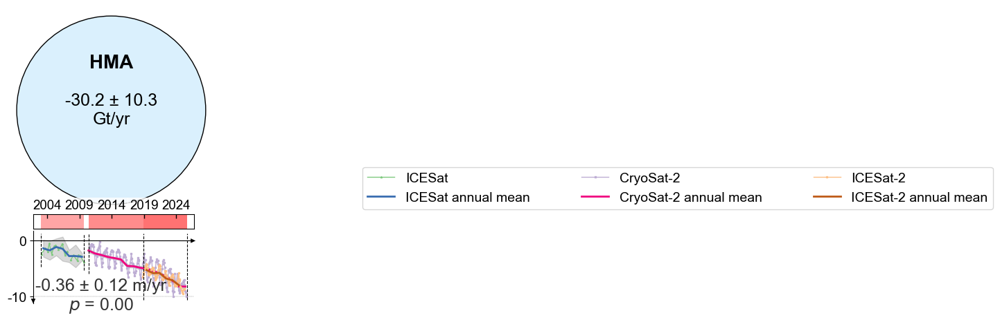

In [50]:
# 设置要分析的子区域索引
# 例如 j = 26 对应 W Kunlun Shan (西昆仑山)
j = 0
region_name = head[j]

plot_region_timeseries(region_name, trend_results, corr_plot, 
                            hampel_icesat_corrected, hampel_cryosat2_corrected, hampel_icesat2_corrected,
                            icesat_uncert, cryosat2_uncert, icesat2_uncert,
                            tws_trend_corrected, correction,
                            icesat_year_corr, cryosat2_year_corr, icesat2_year_corr,
                            icesat_uncert_year_corr, cryosat2_uncert_year_corr, icesat2_uncert_year_corr,
                            save_path=r'E:\revised_NCC_data\Altimetry_intergation\figures_legend\HMA_legend.pdf', display_TWS=False, tws_addition_corr=0,
                            icesat_addition_corr=0, cryosat2_addition_corr=0)


## 7. 批量处理功能

对于需要处理多个子区域的情况，可以使用批处理功能


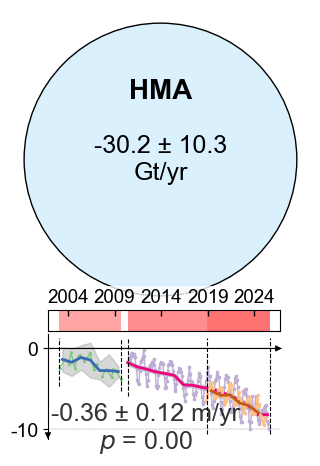

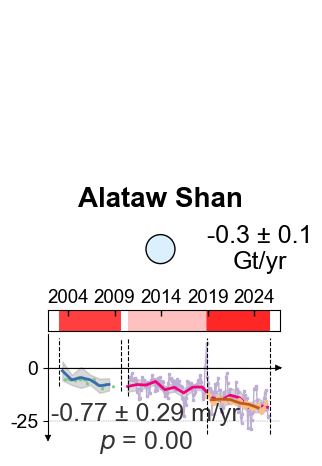

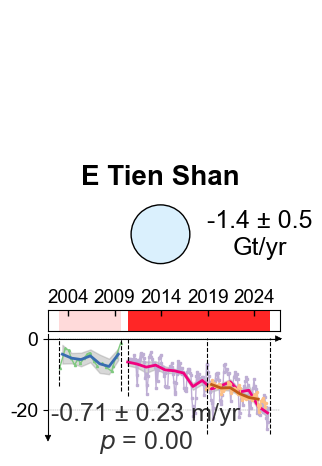

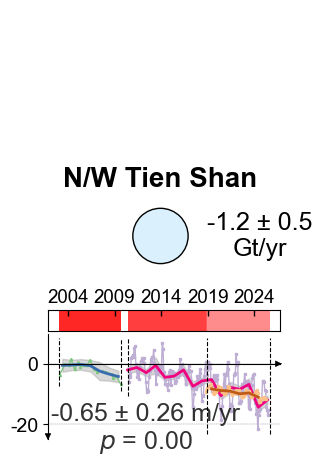

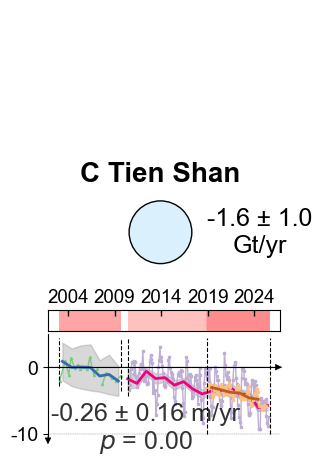

...

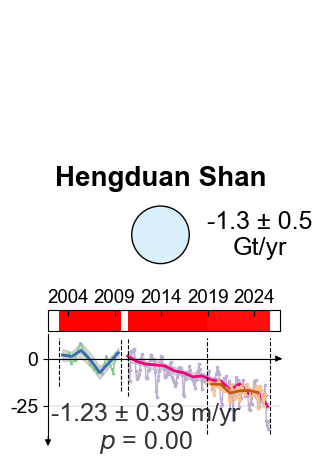

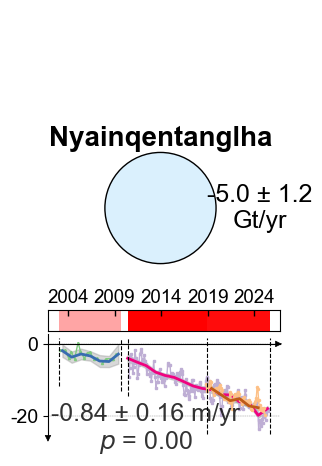

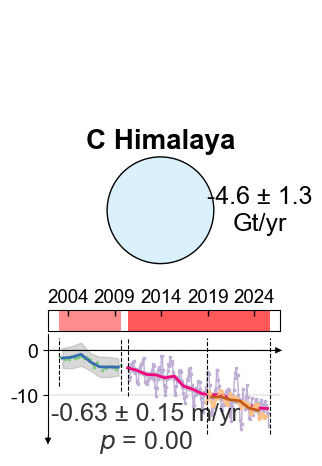

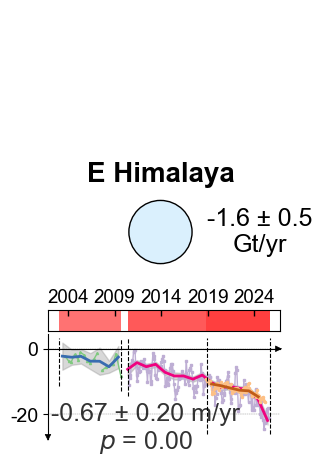

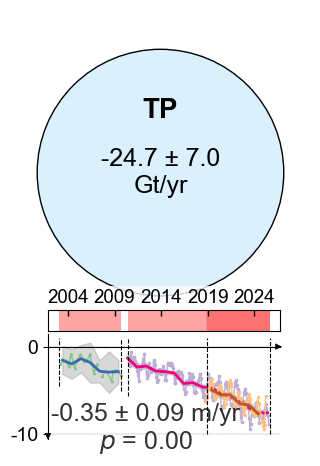

In [26]:
save_folder = r'E:\revised_NCC_data\Altimetry_intergation\figures'
saved_regions = [head[0]] + head[16:]

for region_name in saved_regions:
    saved_path = os.path.join(save_folder, f'【{head.index(region_name)+1}】{region_name}.pdf')
    if '.1' in saved_path:
        saved_path = saved_path.replace('.1', '')
    if '/' in saved_path:
        saved_path = saved_path.replace('/', '-')
    
    plot_region_timeseries(region_name, trend_results, corr_plot, 
                            hampel_icesat_corrected, hampel_cryosat2_corrected, hampel_icesat2_corrected,
                            icesat_uncert, cryosat2_uncert, icesat2_uncert,
                            tws_trend_corrected, correction,
                            icesat_year_corr, cryosat2_year_corr, icesat2_year_corr,
                            icesat_uncert_year_corr, cryosat2_uncert_year_corr, icesat2_uncert_year_corr,
                            save_path=saved_path, display_TWS=False)
    

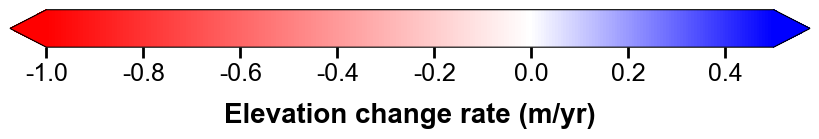

In [55]:
# colorbar
colors = ['red', 'white', 'blue']
nodes = [0, 0.66666666, 1]
colormap = mcolors.LinearSegmentedColormap.from_list('cmap', list(zip(nodes, colors)))

fig = plt.figure(figsize=(10, 1.5))
ax = fig.add_axes([0.1, 0.4, 0.8, 0.25])  # [left, bottom, width, height]

norm = mcolors.Normalize(vmin=-1, vmax=0.5)
cbar = mpl.colorbar.ColorbarBase(
    ax, 
    cmap=colormap,
    norm=norm,
    orientation='horizontal',
    extend='both'  # 显示上下箭头表示超出范围
)

cbar.cmap.set_under('red')
cbar.cmap.set_over('blue')

# 设置标签和刻度
cbar.set_label('Elevation change rate (m/yr)', 
                fontsize=20, family='Arial', weight='bold', labelpad=12)
cbar.ax.tick_params(labelsize=18, direction='out', length=8, width=2)

plt.savefig(r'E:\revised_NCC_data\Altimetry_intergation\figures_legend\colorbar.pdf', dpi=600, bbox_inches='tight')

## 11. 研究区边界地图绘制

本节提供高亚洲研究区边界的可视化功能：
- ✅ 研究区总边界展示
- ✅ 子区域划分边界
- ✅ 冰川边界（可选）
- ✅ 高质量地形底图


### 11.1 加载地理边界数据


In [11]:
# 地理边界数据路径配置
boundary_paths = {
    'studyregion': "E:/HMA/HMA_boundary/HMA_one.shp",  # 研究区总边界
    'subregion': "E:/HMA_subregion/regions_hma_v03_zheng/boundary_mountain_regions_hma_v3_zheng_20200601.shp",  # 子区域
    'glacier': "E:/HMA/Hugonnet/per_glacier/rgi_hma.shp"  # 冰川边界（可选）
}

# 加载边界数据
studyregion = gpd.read_file(boundary_paths['studyregion'])
subregion = gpd.read_file(boundary_paths['subregion'])
glacier = gpd.read_file(boundary_paths['glacier'])
glacier['geometry'] = glacier.geometry.simplify(tolerance=0.1, preserve_topology=True)

print("✓ 边界数据加载成功")
print(f"  研究区边界: {len(studyregion)} 个要素")
print(f"  子区域: {len(subregion)} 个")
print(f"  冰川: {len(glacier)} 个")


✓ 边界数据加载成功
  研究区边界: 1 个要素
  子区域: 22 个
  冰川: 95536 个


### 11.2 研究区边界地图绘制函数


In [12]:
def plot_study_region_boundaries(
    show_studyregion=False,
    show_subregion=True,
    show_glacier=False,
    show_rivers=True,
    show_lakes=True,
    studyregion_color='darkred',
    studyregion_linewidth=3,
    subregion_color='maroon',
    subregion_linewidth=2,
    glacier_color='dodgerblue',
    glacier_alpha=0.5,
    basemap='arcgis_terrain',
    figsize=(16, 12),
    dpi=600,
    title=None,
    save_path=None
):
    """
    绘制高亚洲研究区边界地图（仅边界，无数据可视化）
    
    参数:
        show_studyregion: bool, 是否显示研究区总边界
        show_subregion: bool, 是否显示子区域边界
        show_glacier: bool, 是否显示冰川边界
        show_rivers: bool, 是否显示河流
        show_lakes: bool, 是否显示湖泊
        studyregion_color: str, 研究区总边界颜色
        studyregion_linewidth: float, 研究区总边界线宽
        subregion_color: str, 子区域边界颜色
        subregion_linewidth: float, 子区域边界线宽
        glacier_color: str, 冰川颜色
        glacier_alpha: float, 冰川透明度
        basemap: str, 底图类型 ('arcgis_terrain', 'arcgis_imagery', 'none')
        figsize: tuple, 图形大小
        dpi: int, 图形分辨率
        title: str, 地图标题（可选）
        save_path: str, 保存路径（可选）
    
    返回:
        fig, ax: matplotlib图形对象
    """
    # 底图配置
    basemap_urls = {
        'arcgis_terrain': 'https://server.arcgisonline.com/arcgis/rest/services/World_Terrain_Base/MapServer/tile/{z}/{y}/{x}.jpg',
        'arcgis_imagery': 'https://server.arcgisonline.com/arcgis/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}.jpg',
        'arcgis_shaded': 'https://server.arcgisonline.com/arcgis/rest/services/World_Shaded_Relief/MapServer/tile/{z}/{y}/{x}.jpg'
    }
    
    # 创建图形
    fig = plt.figure(figsize=figsize, dpi=dpi)
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    
    # 设置地图范围（高亚洲区域）
    extent = [63.6, 108.3, 24.5, 47.5]
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    
    # 添加底图
    if basemap != 'none' and basemap in basemap_urls:
        tiles = cimgt.GoogleTiles(url=basemap_urls[basemap])
        ax.add_image(tiles, 9)
    
    # 添加自然地理要素
    if show_rivers:
        ax.add_feature(cfeat.RIVERS.with_scale('10m'), 
                      linewidth=1.5, zorder=1, alpha=0.6, color='steelblue')
    if show_lakes:
        ax.add_feature(cfeat.LAKES.with_scale('10m'), 
                      zorder=1, alpha=0.6, facecolor='lightblue', edgecolor='steelblue')
    
    # 绘制冰川（如果需要，在边界之前绘制）
    if show_glacier:
        glacier.plot(ax=ax, color=glacier_color, edgecolor=glacier_color, 
                    linewidth=0.2, alpha=glacier_alpha, zorder=2)
    
    # 绘制子区域边界
    if show_subregion:
        subregion.plot(ax=ax, facecolor="none", edgecolor=subregion_color, 
                      linewidth=subregion_linewidth, zorder=5)
    
    # 绘制研究区总边界（在最上层）
    if show_studyregion:
        studyregion.plot(ax=ax, facecolor="none", edgecolor=studyregion_color, 
                        linewidth=studyregion_linewidth, zorder=6, linestyle='-')
    
    # 添加网格线
    #ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.3, color='gray', zorder=0)
    
    # 设置坐标轴
    # ax.set_xticks(np.arange(65, extent[1], 5), crs=ccrs.PlateCarree())
    # ax.set_yticks(np.arange(26, extent[3], 3), crs=ccrs.PlateCarree())
    # ax.xaxis.set_major_formatter(LongitudeFormatter())
    # ax.yaxis.set_major_formatter(LatitudeFormatter())
    # ax.tick_params(axis='both', labelsize=15, direction='out', pad=5)
    # ax.tick_params(axis='y', labelrotation=0)
    # ax.tick_params(axis='x', labelrotation=0)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # 添加标题
    if title:
        ax.set_title(title, fontsize=22, pad=20, family='Arial', weight='bold')
    
    # 保存图形
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight', 
                   facecolor='white', edgecolor='none')
    
    return fig, ax


### 11.3 使用示例


d:\Anaconda\install\envs\gee_dask\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


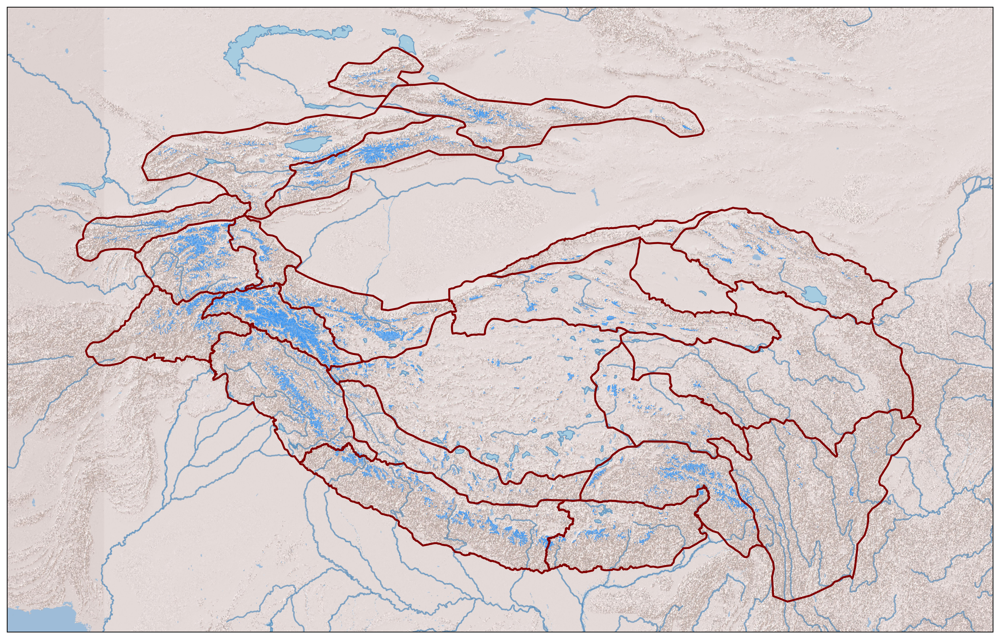

In [13]:
# 示例3：详细地图 - 显示子区域和冰川分布

fig, ax = plot_study_region_boundaries(
    show_studyregion=False,
    show_subregion=True,
    show_glacier=True,          # 显示冰川
    show_rivers=True,
    show_lakes=True,
    subregion_color='maroon',
    subregion_linewidth=2,
    glacier_color='dodgerblue', # 冰川用蓝色
    glacier_alpha=0.5,          # 半透明
    basemap='arcgis_shaded',
    figsize=(18, 14),
    dpi=300,
    save_path=r'E:\revised_NCC_data\Altimetry_intergation\map\HMA_map.pdf'
)
plt.show()
